In [2]:
%load_ext autoreload
%autoreload 2

from pathlib import Path

from coralshift.utils import file_ops, config
# from coralshift.dataloading import get_data

import warnings
warnings.filterwarnings(action="ignore", category=RuntimeWarning)

# gt_data dir
gt_data_dir = config.gt_data_dir
config_info = file_ops.read_yaml("/maps/rt582/coralshift/runs/config_files/config_test.yaml")

from dask.distributed import get_client, Client, LocalCluster

cluster = LocalCluster(n_workers=4)
client = Client(cluster)
# client.close()
# cluster.close()


from coralshift.plotting import spatial_plots
# from coralshift.machine_learning import static_models
from coralshift.processing import ml_processing

import xarray as xa

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


Loading UNEP xarray at 0.004 degrees resolution.
	applying spatial buffering...
1 raster(s) to spatially buffer...


Buffering variables:   0%|          | 0/1 [00:00<?, ?it/s]

	resampling dataset to 0.01 degree(s) resolution...



(<Figure size 3000x3000 with 2 Axes>,
 <GeoAxes: title={'center': 'UNEP_GDCR at 0.0100° (~1085 m) resolution'}, xlabel='longitude', ylabel='latitude'>,
 <cartopy.mpl.geocollection.GeoQuadMesh at 0x7f08cfa126d0>)

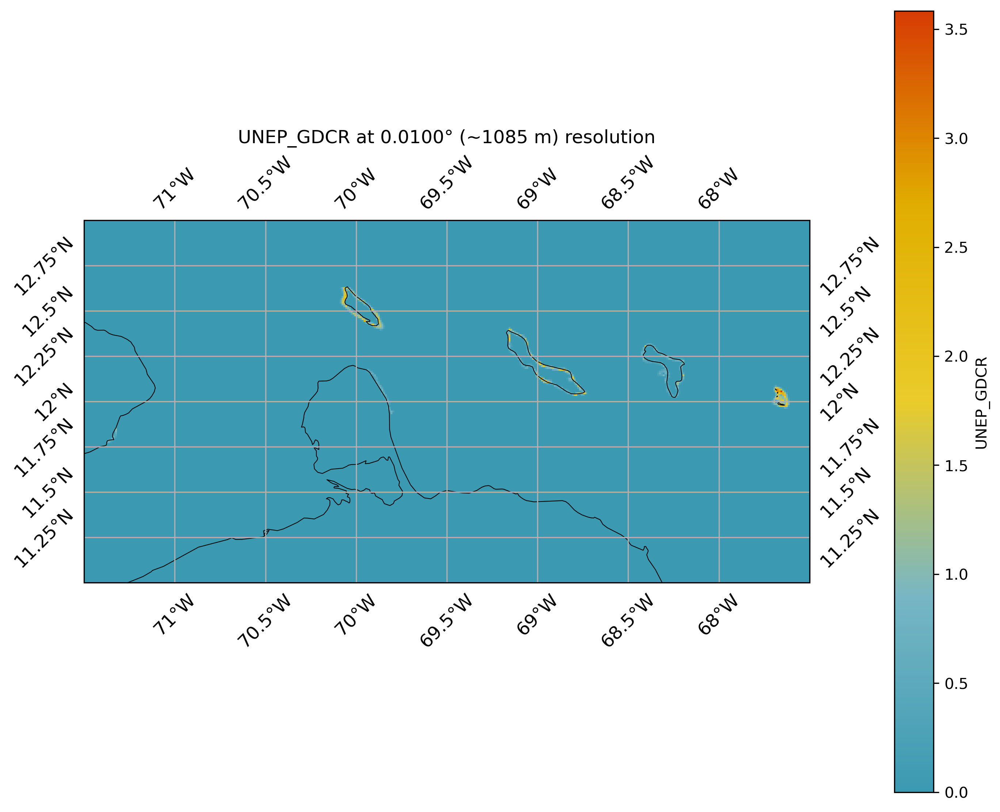

In [3]:
curacao_config_info = file_ops.read_yaml("/maps/rt582/coralshift/runs/config_files/curacao.yaml") 

curacao_ds = ml_processing.ProcessMLData(config_info=curacao_config_info).get_merged_datasets()
spatial_plots.plot_spatial(curacao_ds["UNEP_GDCR"])

In [11]:
config.repo_dir

PosixPath('/maps-priv/maps/rt582/coralshift')

In [13]:
config.static_cmip6_data_dir

PosixPath('/maps-priv/maps/rt582/coralshift/data/env_vars/cmip6/EC-Earth3P-HR/r1i1p2f1_latlon')

In [4]:
config_info = file_ops.read_yaml("/maps/rt582/coralshift/runs/config_files/config_test.yaml")

(trains, tests, vals), ds_info = ml_processing.ProcessMLData(
    model_data=config_info["ds_type"],
    datasets=config_info["datasets"],
    train_test_val_frac=config_info["train_test_val_frac"],
    X_scaler=config_info["predictor_scaler"],
    y_scaler=config_info["predictand_scaler"],
    split_type=config_info["split_type"],
    depth_mask_lims=config_info["depth_mask_lims"],
    lats=config_info["lats"],
    lons=config_info["lons"],
    levs=config_info["levs"],
    resolution=config_info["resolution"],
    pos_neg_ratio=config_info["pos_neg_ratio"],
    resolution_unit=config_info["resolution_unit"],
    upsample_method=config_info["upsample_method"],
    downsample_method=config_info["downsample_method"],
    env_vars=config_info["env_vars"],
    predictand=config_info["predictand"],
    random_state=config_info["random_state"],
).generate_ml_ready_data()

AttributeError: 'NoneType' object has no attribute 'copy'

In [ ]:
get_data.RunML(
    trains=trains,
    tests=tests,
    vals=vals,
    config_info = file_ops.read_yaml(Path("/maps/rt582/coralshift/runs/config_files/config_test.yaml"))
).run_model()

In [3]:
# config_fps weirdly being overwritten without cause, even when not running the function (not that this should do anything)
config_fps = Path("/maps/rt582/coralshift/runs/config_files/multi_config").glob("*.yaml")
get_data.run_config_files(fps=config_fps, ds_info=ds_info, trains=trains, tests=tests, vals=vals)


Running parameter search for rf_reg...
Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=64)]: Using backend DaskDistributedBackend with 256 concurrent workers.


[Parallel(n_jobs=-1)]: Using backend DaskDistributedBackend with 256 concurrent workers.
[Parallel(n_jobs=-1)]: Using backend DaskDistributedBackend with 256 concurrent workers.
[Parallel(n_jobs=-1)]: Using backend DaskDistributedBackend with 256 concurrent workers.
[Parallel(n_jobs=-1)]: Using backend DaskDistributedBackend with 256 concurrent workers.
[Parallel(n_jobs=-1)]: Using backend DaskDistributedBackend with 256 concurrent workers.
[Parallel(n_jobs=-1)]: Using backend DaskDistributedBackend with 256 concurrent workers.
[Parallel(n_jobs=-1)]: Using backend DaskDistributedBackend with 256 concurrent workers.
[Parallel(n_jobs=-1)]: Using backend DaskDistributedBackend with 256 concurrent workers.
[Parallel(n_jobs=-1)]: Using backend DaskDistributedBackend with 256 concurrent workers.
[Parallel(n_jobs=-1)]: Using backend DaskDistributedBackend with 256 concurrent workers.
[Parallel(n_jobs=-1)]: Using backend DaskDistributedBackend with 256 concurrent workers.
[Parallel(n_jobs=-1)]

2024-04-24 09:48:56,323 - distributed.scheduler - ERROR - Error transitioning 'ndarray-3a3ff813de8d45a5b3172a4e0ed00aa1' from 'waiting' to 'processing'
Traceback (most recent call last):
  File "/home/rt582/miniforge3/envs/coralshift/lib/python3.11/site-packages/distributed/scheduler.py", line 1954, in _transition
    recommendations, client_msgs, worker_msgs = func(
                                                ^^^^^
  File "/home/rt582/miniforge3/envs/coralshift/lib/python3.11/site-packages/distributed/scheduler.py", line 2328, in _transition_waiting_processing
    return self._add_to_processing(ts, ws, stimulus_id=stimulus_id)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/rt582/miniforge3/envs/coralshift/lib/python3.11/site-packages/distributed/scheduler.py", line 3244, in _add_to_processing
    return {}, {}, {ws.address: [self._task_to_msg(ts)]}
                                 ^^^^^^^^^^^^^^^^^^^^^
  File "/home/rt582/miniforge3/envs/coralshi

In [ ]:
# investigating existingm reducing classification threshold
model = file_ops.read_pkl("/maps/rt582/coralshift/runs/0-05d/xgb_reg/ID005_cmip6_unep_gebco_MODEL.pickle")
model_config_info = file_ops.read_yaml("/maps/rt582/coralshift/runs/0-05d/xgb_reg/ID005_cmip6_unep_gebco_CONFIG.yaml")

get_data.AnalyseResults(
    model=model,
    trains=trains,
    tests=tests,
    vals=vals,
    config_info=model_config_info).analyse_results()

In [16]:
config_info = file_ops.read_yaml("/maps/rt582/coralshift/runs/config_files/config_test.yaml")

raster = get_data.ReturnRaster(
    dataset="cmip",
).get_raw_raster()
raster

<xarray.Dataset>
Dimensions:    (time: 780, latitude: 641, longitude: 1440, bnds: 2)
Coordinates:
  * time       (time) datetime64[ns] 1950-01-16T12:00:00 ... 2014-12-16T12:00:00
  * longitude  (longitude) float64 -180.0 -179.8 -179.5 ... 179.2 179.5 179.8
  * latitude   (latitude) float64 -78.74 -78.49 -78.24 ... 80.76 81.01 81.26
Dimensions without coordinates: bnds
Data variables:
    tos        (time, latitude, longitude) float32 ...
    time_bnds  (time, bnds) datetime64[ns] ...
    so         (time, latitude, longitude) float32 ...
    rsdo       (time, latitude, longitude) float32 ...
    uo         (time, latitude, longitude) float32 ...
    thetao     (time, latitude, longitude) float32 ...
    vo         (time, latitude, longitude) float32 ...
    mlotst     (time, latitude, longitude) float32 ...
Attributes:
    CDI:          Climate Data Interface version 2.3.0 (https://mpimet.mpg.de...
    Conventions:  CF-1.6
    history:      Sun Mar 03 14:54:20 2024: cdo -O -s -remapbil,data/env_vars...
    CDO:          Climate Data Operators version 2.3.0 (https://mpimet.mpg.de...

In [18]:
from coralshift.processing import spatial_data
raster = spatial_data.process_xa_d(raster)

In [22]:
raster["tos"].

<xarray.DataArray 'tos' (time: 780, latitude: 641, longitude: 1440)>
[719971200 values with dtype=float32]
Coordinates:
  * time       (time) datetime64[ns] 1950-01-16T12:00:00 ... 2014-12-16T12:00:00
  * longitude  (longitude) float64 -180.0 -179.8 -179.5 ... 179.2 179.5 179.8
  * latitude   (latitude) float64 -78.74 -78.49 -78.24 ... 80.76 81.01 81.26
Attributes:
    standard_name:  sea_surface_temperature
    long_name:      Sea Surface Temperature
    units:          degC
    comment:        Temperature of upper boundary of the liquid ocean, includ...
    original_name:  tos
    cell_methods:   area: mean where sea time: mean
    cell_measures:  area: areacello
    history:        2018-09-22T14:27:27Z altered by CMOR: Reordered dimension...
    _ChunkSizes:    [  1 525 721]

In [29]:
raster["tos"].isel(time=slice(0,10)).sel(latitude=slice(-5,0), longitude=slice(140,145))

<xarray.DataArray 'tos' (time: 10, latitude: 20, longitude: 21)>
[4200 values with dtype=float32]
Coordinates:
  * time       (time) datetime64[ns] 1950-01-16T12:00:00 ... 1950-10-16T12:00:00
  * longitude  (longitude) float64 140.0 140.2 140.5 140.8 ... 144.5 144.8 145.0
  * latitude   (latitude) float64 -4.992 -4.742 -4.492 ... -0.4917 -0.2417
Attributes:
    standard_name:  sea_surface_temperature
    long_name:      Sea Surface Temperature
    units:          degC
    comment:        Temperature of upper boundary of the liquid ocean, includ...
    original_name:  tos
    cell_methods:   area: mean where sea time: mean
    cell_measures:  area: areacello
    history:        2018-09-22T14:27:27Z altered by CMOR: Reordered dimension...
    _ChunkSizes:    [  1 525 721]

AttributeError: module 'coralshift.utils.file_ops' has no attribute 'guarantee_existence'

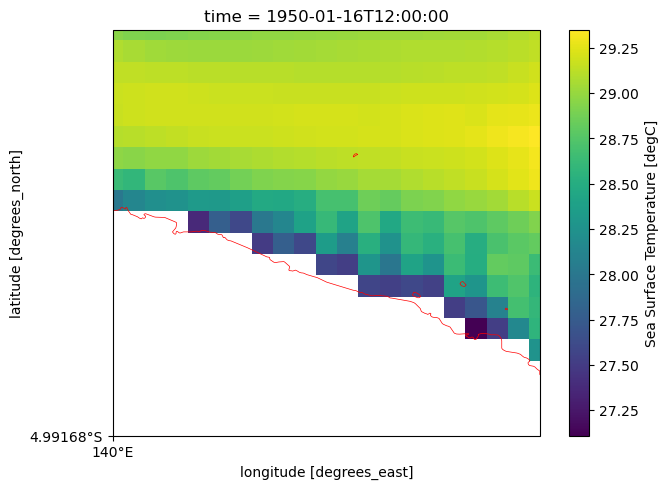

In [30]:
spatial_plots.generate_variable_timeseries_gif(raster["tos"].isel(time=slice(0,10)).sel(latitude=slice(-5,0), longitude=slice(140,145)))